# Name: Shubham Kshirsagar , Roll no : 23210097
 
# Q3 Implementation of Weiner Filter

In [1]:
import numpy as np
import cv2
from numpy.fft import fft2, ifft2
from scipy.signal import convolve2d
import matplotlib.pyplot as plt

In [2]:
def blur(i, k):
    i1 = np.copy(i)
    factor = 1 / k
    modifiedDiagnolMatrix = factor * np.eye(k)  x
    return convolve2d(i1, modifiedDiagnolMatrix, mode='valid')


In [3]:
def addGaussNoise(i, standev):
    mean = 0
    gauss = np.random.normal(mean, standev, np.shape(i))  # random gaussian probablity distribution
    noisyimage = i + gauss
    return noisyimage

In [4]:
def gaussian(M, std, sym=True):

    if M < 1:
        return np.array([])
    if M == 1:
        return np.ones(1, 'd')
    odd = M % 2
    if not sym and not odd:
        M = M + 1
    n = np.arange(0, M) - (M - 1.0) / 2.0
    sig2 = 2 * std * std
    w = np.exp(-n ** 2 / sig2)
    if not sym and not odd:
        w = w[:-1]
    return w

In [5]:
def gaussian_kernel(kernel_size=3):
    h = gaussian(kernel_size, kernel_size / 3).reshape(kernel_size, 1)  #
    h = np.dot(h, h.transpose())  # dot prod of gaussian matrix and its transpose
    h1 = h/np.sum(h)  # np.sum(h) computes the sum of all the elements in the matrix h
    return h1

In [6]:
#Implementation of Weiner Filter

def wiener_filter(img, kernel, K):
    kernel = kernel/np.sum(kernel)  
    imgcopy = np.copy(img)
    fourierimg = fft2(imgcopy)  
    kernel = fft2(kernel, s=img.shape)  
    kernel = np.conj(kernel) / (np.abs(kernel) ** 2 + K)  
    convolvedimg = fourierimg * kernel  
    invfourier = np.abs(ifft2(convolvedimg)) 
    return invfourier

In [7]:
def plot(adress,dev):
    if __name__ == '__main__':
        path = adress
        # Original Image
        img = cv2.imread(path)
        # Grayscale Image
        grayscale_img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

        # Blur the image
        blurred_img = blur(grayscale_img, 10)

        # Add Gaussian noise
        noisy_img = addGaussNoise(blurred_img, dev)

        # Apply Wiener Filter
        kernel = gaussian_kernel(2)
        filtered_img = wiener_filter(noisy_img, kernel, 50)

        # Display results
        display = [grayscale_img, blurred_img, noisy_img, filtered_img]
        label = ['Original Image', 'Blurred Image', 'Blur + Gaussian Noise', 'Appled Wiener Filter']

        fig = plt.figure(figsize=(12, 10))
        for i in range(len(display)):
            fig.add_subplot(2, 2, i + 1)
            plt.imshow(display[i], cmap='gray')
            plt.title(label[i])

        plt.show()

        def calculate_psnr(image1, image2):
            if image1.shape[0] != image2.shape[0] or image1.shape[1] != image2.shape[1]:
                image1 = cv2.resize(image1, (image2.shape[1], image2.shape[0]))
                mse = np.mean((image1.astype(np.float32) - image2.astype(np.float32)) ** 2)
                max_pixel = 255.0
                psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
                return psnr
        
        psnr = calculate_psnr(filtered_img,grayscale_img)
        print("The psnr between original and filtered is ",psnr,"db")
 

# Applied Weiner Filter above Implementation and also checked its PSNR metric

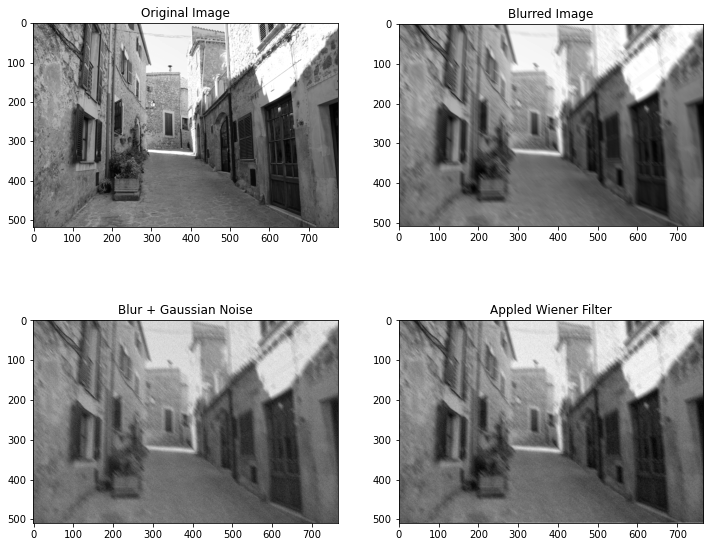

The psnr between original and filtered is  5.473852360776754 db


In [8]:
#Image1 with noise of STD_DEV=10 
plot('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image1.png',10)

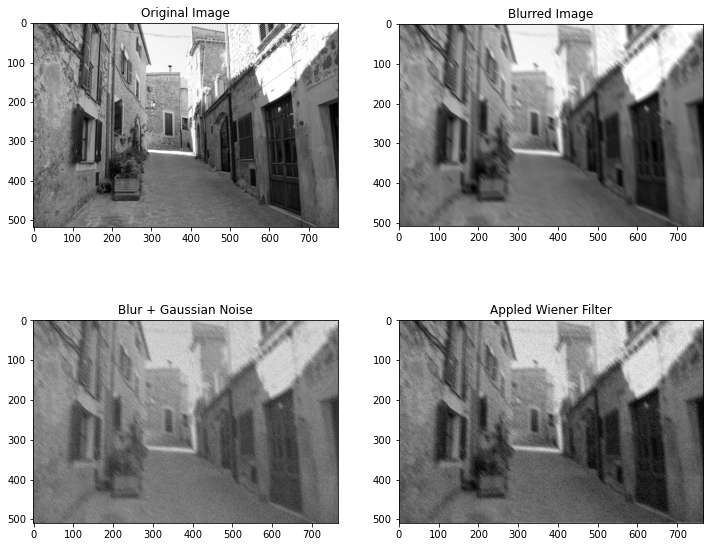

The psnr between original and filtered is  5.473853336859955 db


In [9]:
#Image1 with noise of STD_DEV=20 
plot('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image1.png',20)

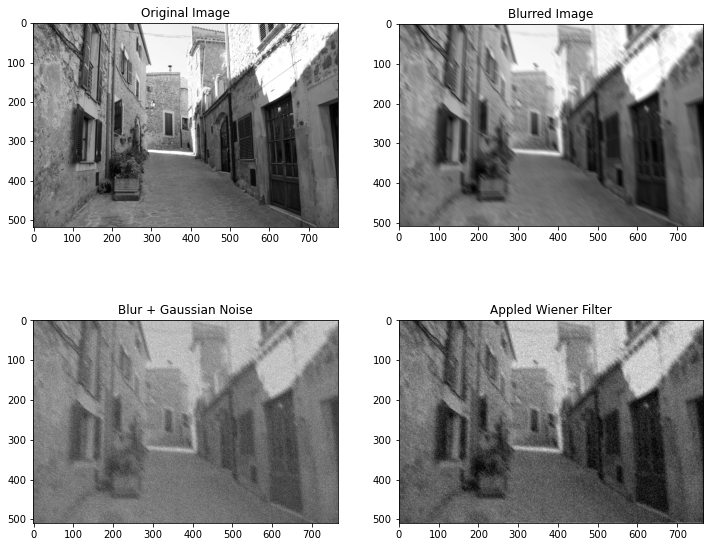

The psnr between original and filtered is  5.473903117248652 db


In [10]:
#Image1 with noise of STD_DEV=30 
plot('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image1.png',30)

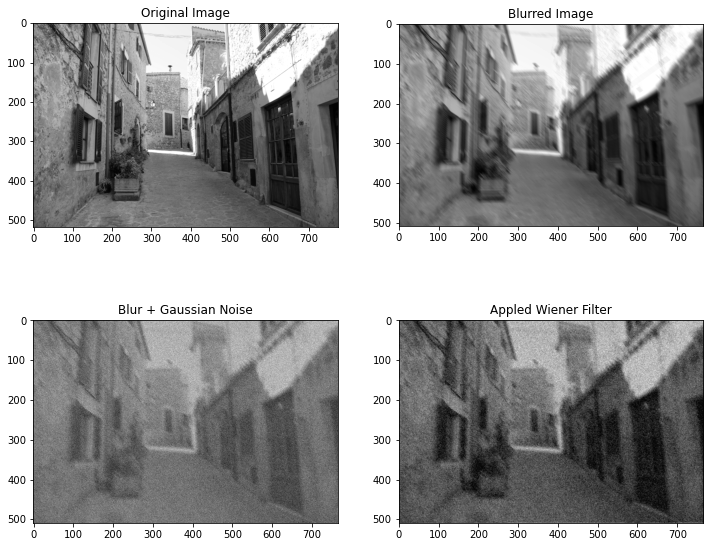

The psnr between original and filtered is  5.473826982652029 db


In [11]:
#Image1 with noise of STD_DEV=40 
plot('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image1.png',40)

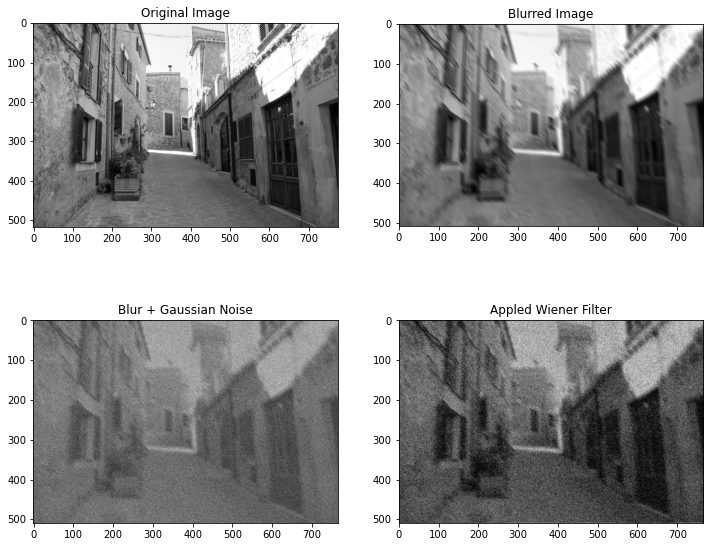

The psnr between original and filtered is  5.474026105314467 db


In [12]:
#Image1 with noise of STD_DEV=50 
plot('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image1.png',50)

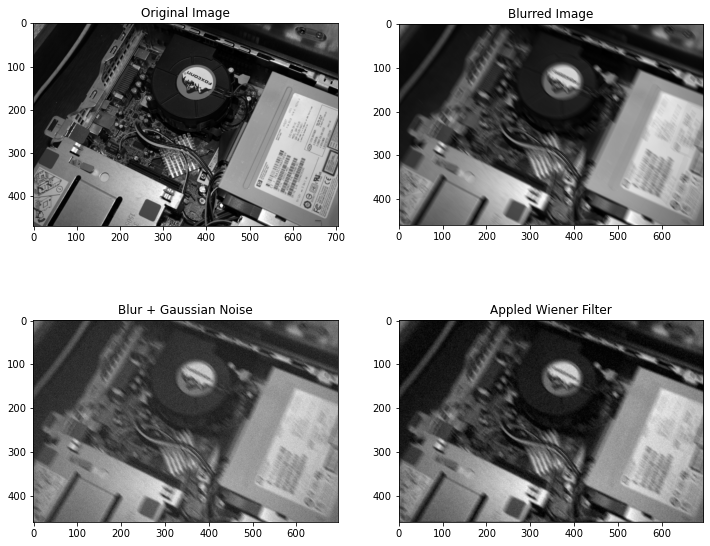

The psnr between original and filtered is  7.629576513480334 db


In [13]:
#Image2 with noise of STD_DEV=10 and blur
plot('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image2.png',10)

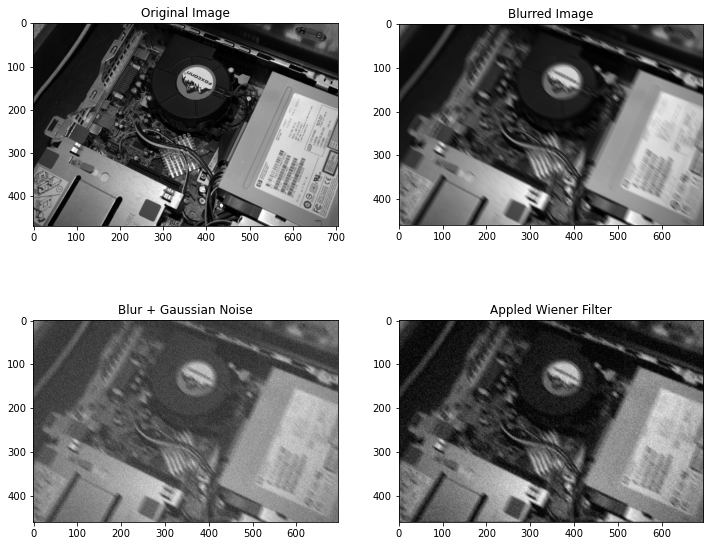

The psnr between original and filtered is  7.629533978045663 db


In [14]:
#Image2 with noise of STD_DEV=20 and blur
plot('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image2.png',20)

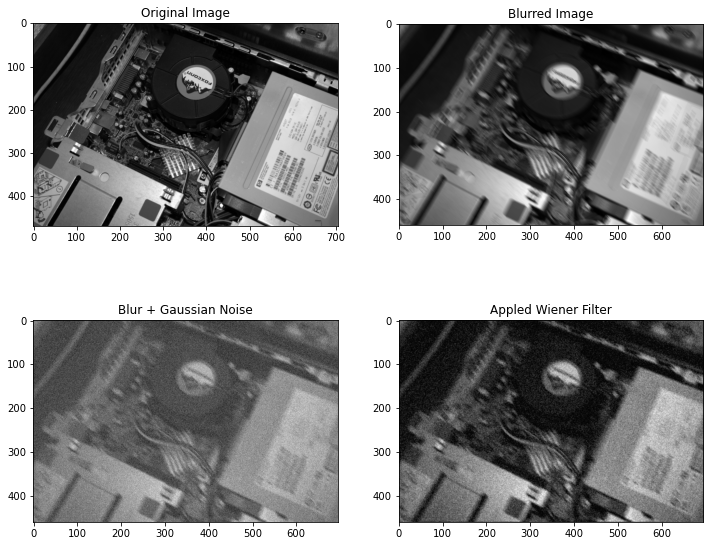

The psnr between original and filtered is  7.629525846295104 db


In [15]:
#Image2 with noise of STD_DEV=30 and blur
plot('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image2.png',30)

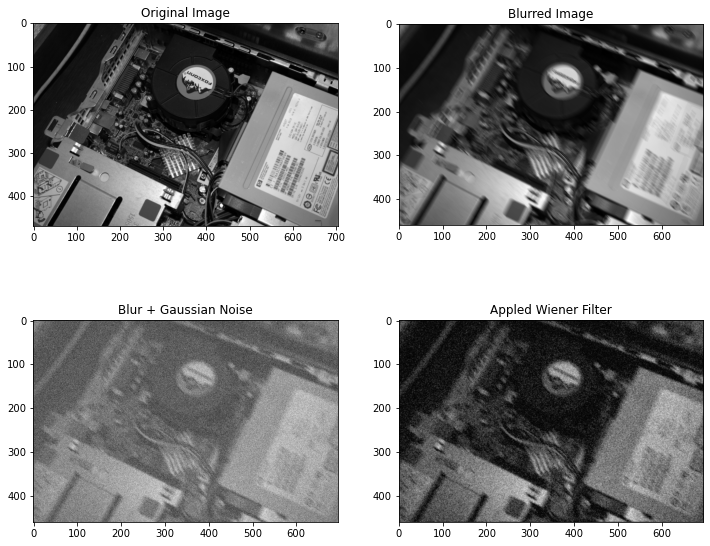

The psnr between original and filtered is  7.629878646165167 db


In [16]:
#Image2 with noise of STD_DEV=40 and blur
plot('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image2.png',40)

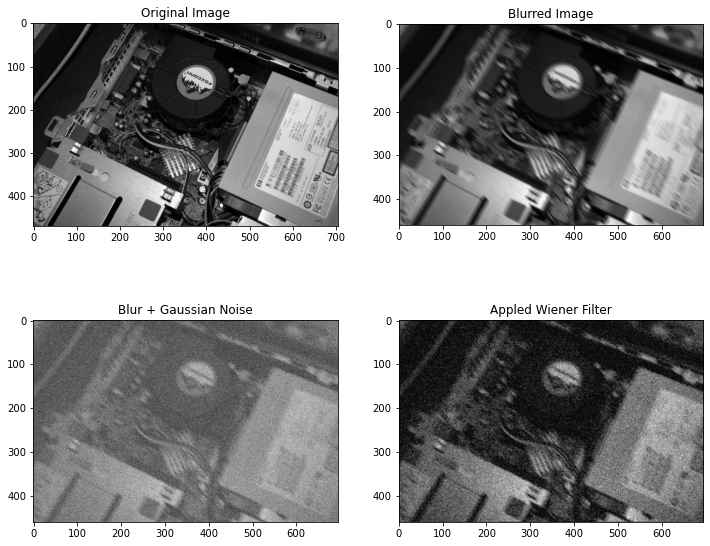

The psnr between original and filtered is  7.63009884058094 db


In [17]:
#Image2 with noise of STD_DEV=50 and blur
plot('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image2.png',50)

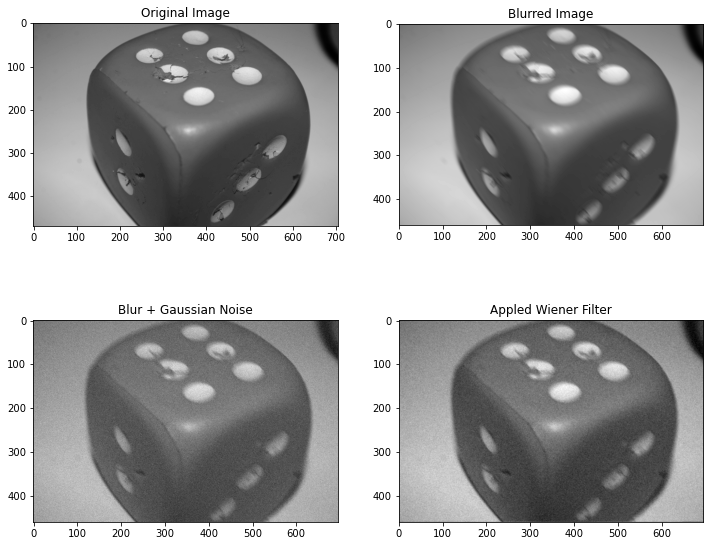

The psnr between original and filtered is  8.671316560186831 db


In [18]:
#Image3 with noise of STD_DEV=10 and blur
plot('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image3.png',10)

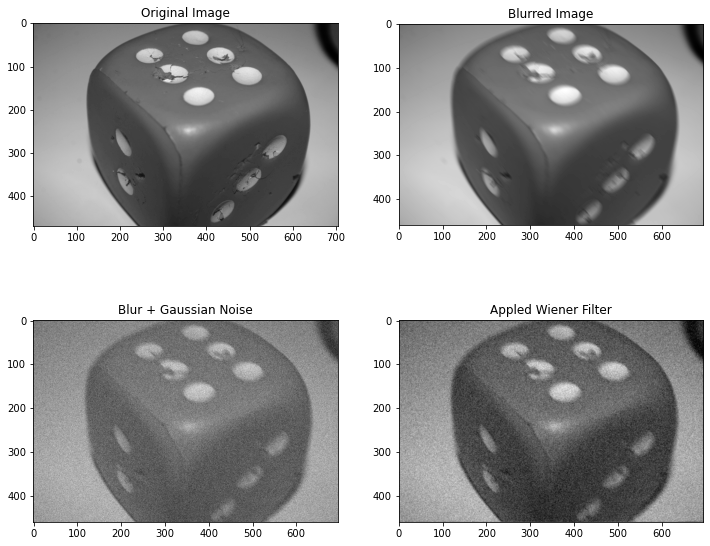

The psnr between original and filtered is  8.671251679381252 db


In [19]:
#Image3 with noise of STD_DEV=20 and blur
plot('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image3.png',20)

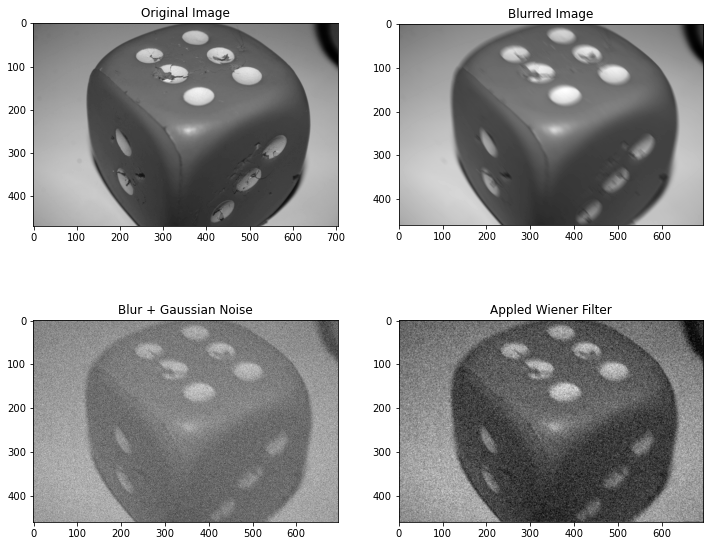

The psnr between original and filtered is  8.671178336445475 db


In [20]:
#Image3 with noise of STD_DEV=30 and blur
plot('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image3.png',30)

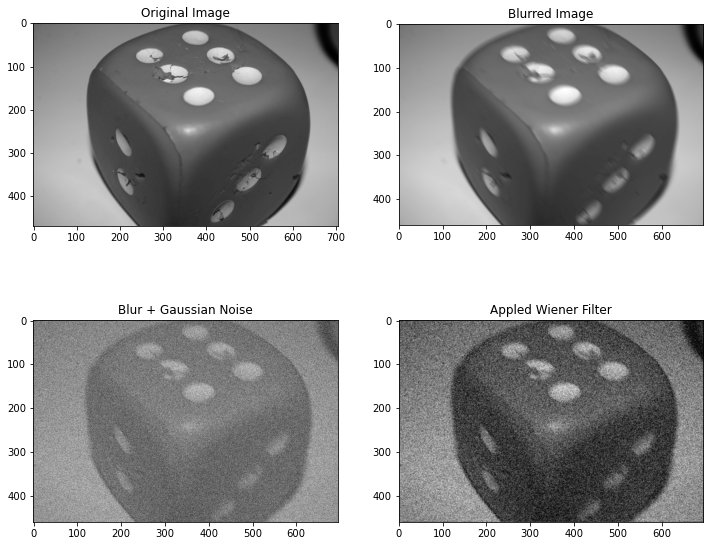

The psnr between original and filtered is  8.671162821673036 db


In [21]:
#Image3 with noise of STD_DEV=40 and blur
plot('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image3.png',40)

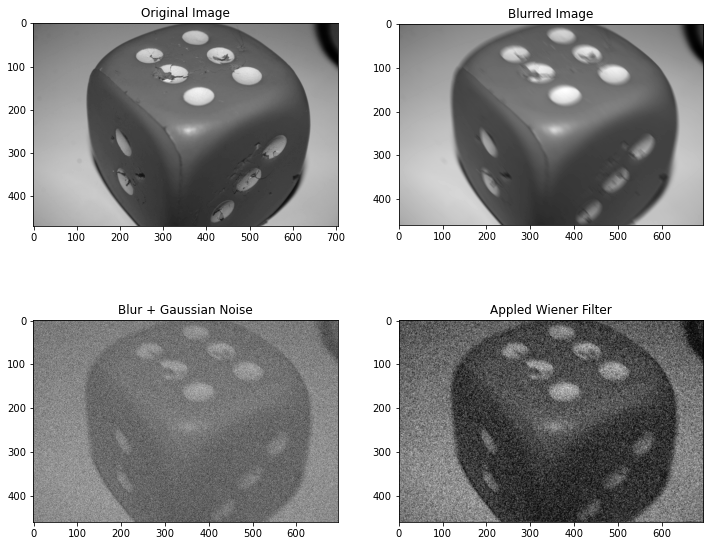

The psnr between original and filtered is  8.671590193264176 db


In [22]:
#Image3 with noise of STD_DEV=50 and blur
plot('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image3.png',50)

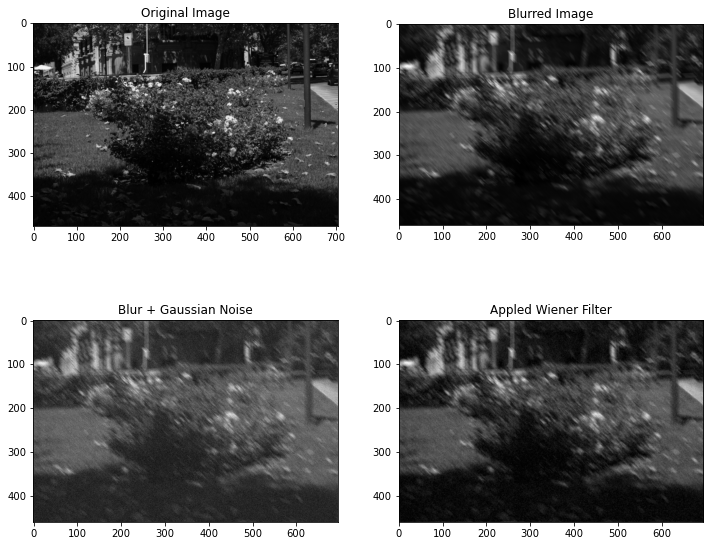

The psnr between original and filtered is  12.497077449387568 db


In [23]:
#Image4 with noise of STD_DEV=10 and blur
plot('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/input4.png',10)

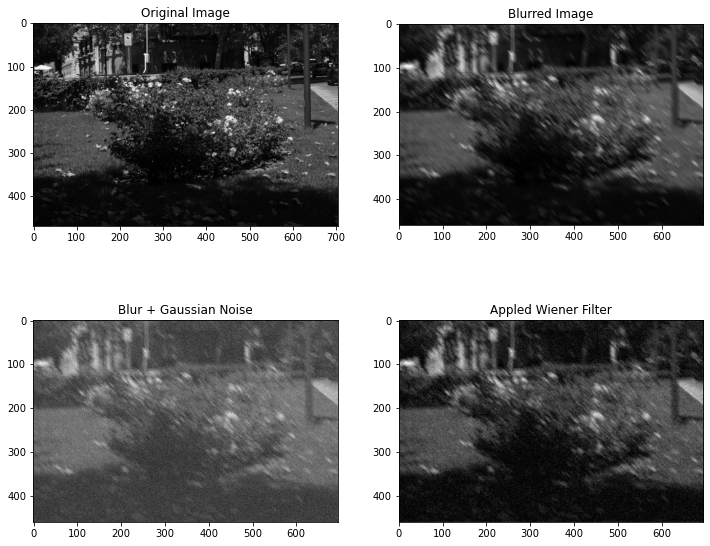

The psnr between original and filtered is  12.497280669677746 db


In [24]:
#Image4 with noise of STD_DEV=20 and blur
plot('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/input4.png',20)

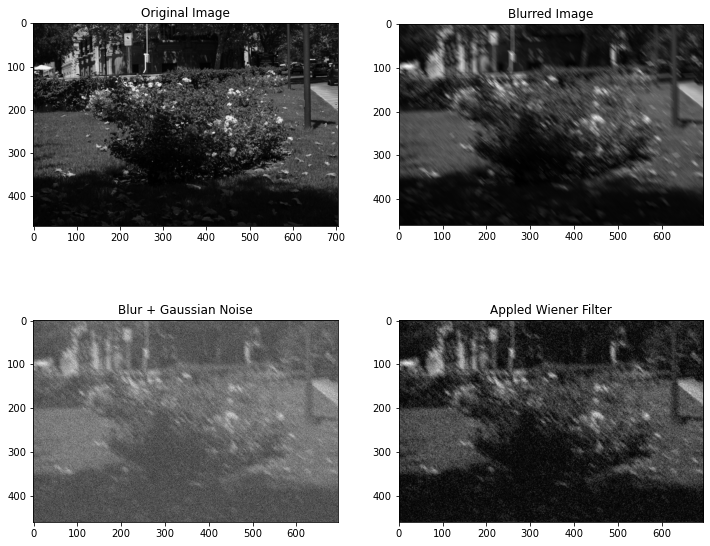

The psnr between original and filtered is  12.497795588733966 db


In [25]:
#Image4 with noise of STD_DEV=30 and blur
plot('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/input4.png',30)

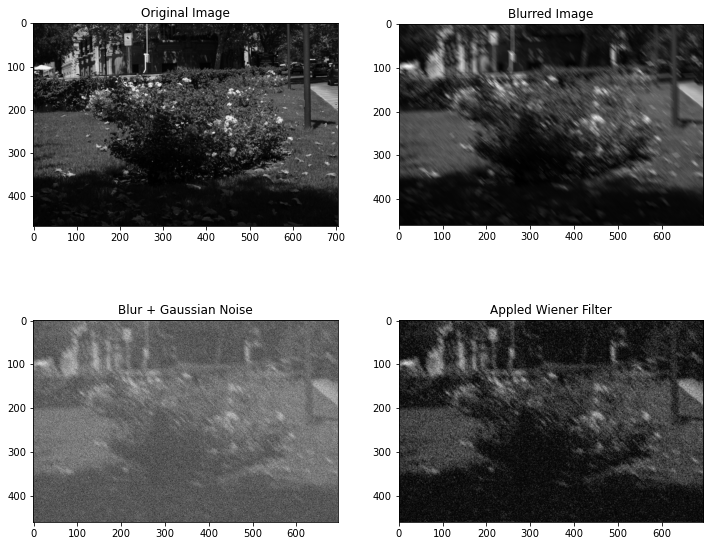

The psnr between original and filtered is  12.498509404679199 db


In [26]:
#Image4 with noise of STD_DEV=40 and blur
plot('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/input4.png',40)

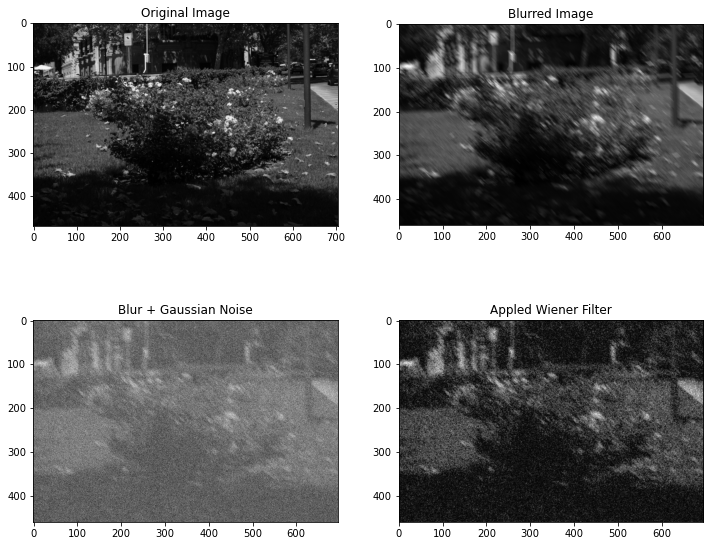

The psnr between original and filtered is  12.49981885887539 db


In [27]:
#Image4 with noise of STD_DEV=50 and blur
plot('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/input4.png',50)

# Q4 Comparison With the Above  defined Weiner Filter and others and wrt PSNR Metric

In [47]:
#NLM And Weiner Comparison of all Images

def plot4(adress,dev):
    if __name__ == '__main__':
        path = adress
        # Original Image
        img = cv2.imread(path)
        # Grayscale Image
        grayscale_img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

        # Blur the image
        blurred_img = blur(grayscale_img, 10)

        # Add Gaussian noise
        noisy_img = addGaussNoise(blurred_img, dev)

        # Apply Wiener Filter
        kernel = gaussian_kernel(2)
        filtered_img = wiener_filter(noisy_img, kernel, 50)
        
        #Apply NLM 
        dst = cv2.fastNlMeansDenoisingColored(img,None,10,7,21)
        dst_gray = cv2.cvtColor(dst, cv2.COLOR_BGR2GRAY)
        
        display = [ noisy_img, filtered_img,dst_gray]
        label = ['Blur + Gaussian Noise', ' Wiener Filtered', 'NLM Filtered']

        fig = plt.figure(figsize=(14, 10))
        for i in range(len(display)-1):
            fig.add_subplot(1, 3, i + 1)
            plt.imshow(display[i], cmap='gray')
            plt.title(label[i])
        plt.subplot(1,3,3)
        plt.imshow(display[2],cmap ='gray')
        plt.title(label[2])
        
        def calculate_psnr(image1, image2):
            if image1.shape[0] != image2.shape[0] or image1.shape[1] != image2.shape[1]:
                image1 = cv2.resize(image1, (image2.shape[1], image2.shape[0]))
                mse = np.mean((image1.astype(np.float32) - image2.astype(np.float32)) ** 2)
                max_pixel = 255.0
                psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
                return psnr
        
        psnrNLM = calculate_psnr(dst_gray,noisy_img)
        print("\n NLM PSNR: ",psnrNLM)
        



 NLM PSNR:  15.431880724161504


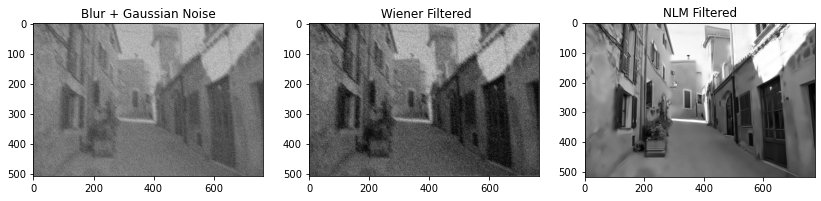

In [52]:
#STD_DEV =40 of Noise
plot4('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image1.png',40 )


 NLM PSNR:  14.765745933313505


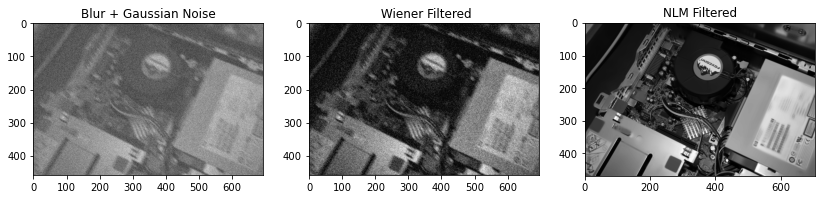

In [53]:
plot4('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image2.png',40 )


 NLM PSNR:  15.922073131840722


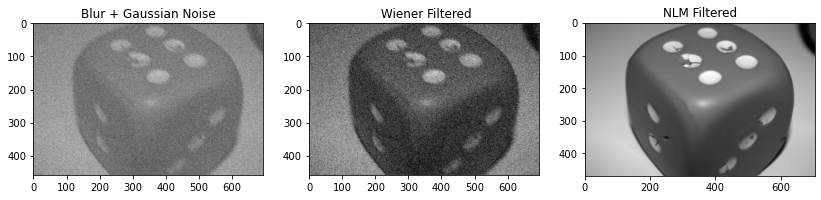

In [54]:
plot4('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image3.png',40 )


 NLM PSNR:  15.076233865225335


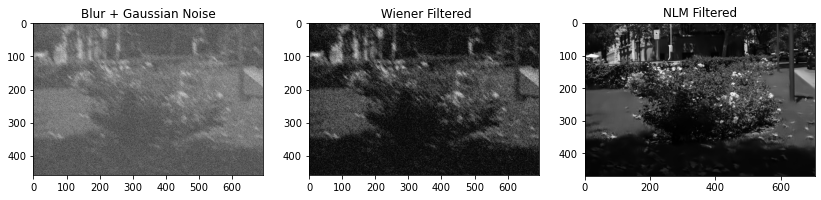

In [55]:
plot4('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/input4.png',40 )

NLM calculates the pixel value by averaging weighted patches in the image, where the weights are determined by the similarity between patches

In [64]:
#Bilateral And Weiner Comparison of all Images

def plot5(adress,dev):
    if __name__ == '__main__':
        path = adress
        # Original Image
        img = cv2.imread(path)
        # Grayscale Image
        grayscale_img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

        # Blur the image
        blurred_img = blur(grayscale_img, 10)

        # Add Gaussian noise
        noisy_img = addGaussNoise(blurred_img, dev)

        # Apply Wiener Filter
        kernel = gaussian_kernel(2)
        filtered_img = wiener_filter(noisy_img, kernel, 50)
        
         #Apply Bilateral Filter 
        nbilateral = cv2.convertScaleAbs(noisy_img)
        dst_gray = cv2.bilateralFilter(nbilateral, d=9, sigmaColor=75, sigmaSpace=75)
        
        display = [ noisy_img, filtered_img,dst_gray]
        label = ['Blur + Gaussian Noise', ' Wiener Filtered', 'Bilateral Filtered']

        fig = plt.figure(figsize=(14, 10))
        for i in range(len(display)-1):
            fig.add_subplot(1, 3, i + 1)
            plt.imshow(display[i], cmap='gray')
            plt.title(label[i])
        plt.subplot(1,3,3)
        plt.imshow(display[2],cmap ='gray')
        plt.title(label[2])
        
        def calculate_psnr(image1, image2):
            if image1.shape[0] != image2.shape[0] or image1.shape[1] != image2.shape[1]:
                image1 = cv2.resize(image1, (image2.shape[1], image2.shape[0]))
                mse = np.mean((image1.astype(np.float32) - image2.astype(np.float32)) ** 2)
                max_pixel = 255.0
                psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
                return psnr
        
        psnrBilateral = calculate_psnr(dst_gray,grayscale_img)
        print("\n Bilateral PSNR: ",psnrBilateral)


 Bilateral PSNR:  20.984716489202853


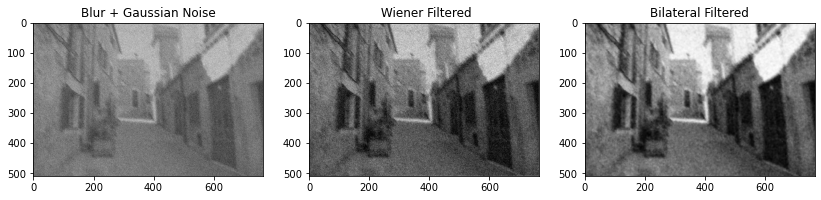

In [65]:
plot5('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image1.png',40)


 Bilateral PSNR:  19.1442100760542


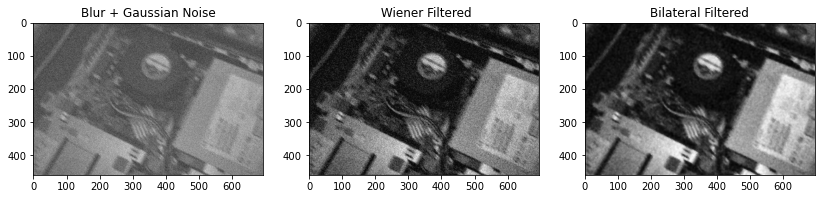

In [66]:
plot5('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image2.png',40)


 Bilateral PSNR:  26.833244123345906


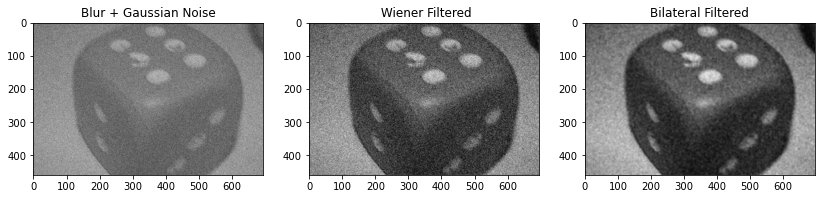

In [67]:
plot5('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image3.png',40)


 Bilateral PSNR:  19.55865940590179


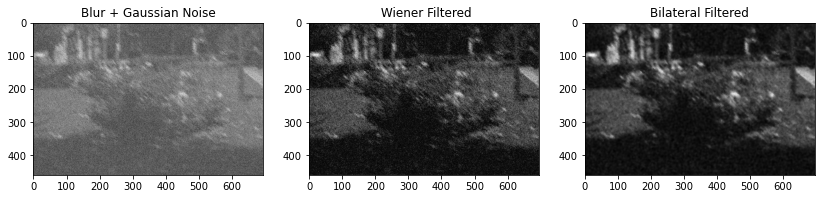

In [68]:
plot5('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/input4.png',40)

The bilateral filter computes the output pixel value by considering a weighted average of neighboring pixels, where the weights are determined by both spatial closeness and intensity similarity

In [84]:
# Median Filter and Weiner  Filter Comparison of All images 

def plot6(adress,dev):
    if __name__ == '__main__':
        path = adress
        # Original Image
        img = cv2.imread(path)
        # Grayscale Image
        grayscale_img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

        # Blur the image
        blurred_img = blur(grayscale_img, 10)

        # Add Gaussian noise
        noisy_img = addGaussNoise(blurred_img, dev)

        # Apply Wiener Filter
        kernel = gaussian_kernel(2)
        filtered_img = wiener_filter(grayscale_img, kernel, 50)
        
         #Apply Median  Filter 
        noisy_image = cv2.convertScaleAbs(noisy_img)
        dst_gray = cv2.medianBlur(noisy_image, ksize=5)
        
        display = [ noisy_img, filtered_img,dst_gray]
        label = ['Blur + Gaussian Noise', ' Wiener Filtered', 'Median  Filtered']

        fig = plt.figure(figsize=(14, 10))
        for i in range(len(display)-1):
            fig.add_subplot(1, 3, i + 1)
            plt.imshow(display[i], cmap='gray')
            plt.title(label[i])
        plt.subplot(1,3,3)
        plt.imshow(display[2],cmap ='gray')
        plt.title(label[2])
        
        def calculate_psnr(image1, image2):
            if image1.shape[0] != image2.shape[0] or image1.shape[1] != image2.shape[1]:
                image1 = cv2.resize(image1, (image2.shape[1], image2.shape[0]))
                mse = np.mean((image1.astype(np.float32) - image2.astype(np.float32)) ** 2)
                max_pixel = 255.0
                psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
                return psnr
        
        psnrMedian = calculate_psnr(dst_gray,grayscale_img)
        print("\n Median PSNR: ",psnrMedian)


 Median PSNR:  21.003031097733768


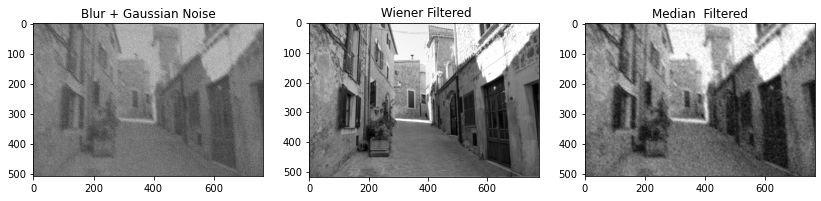

In [85]:
plot6('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image1.png',40)


 Median PSNR:  19.256779404093578


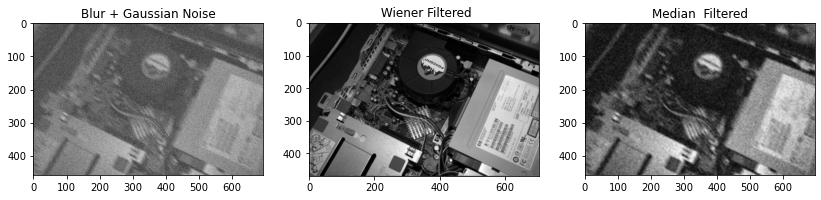

In [86]:
plot6('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image2.png',40)


 Median PSNR:  26.218491078105547


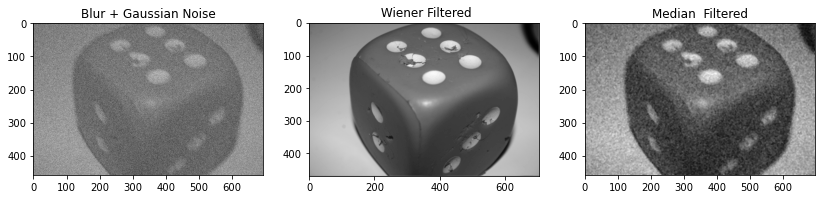

In [87]:
plot6('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image3.png',40)


 Median PSNR:  19.837247988838747


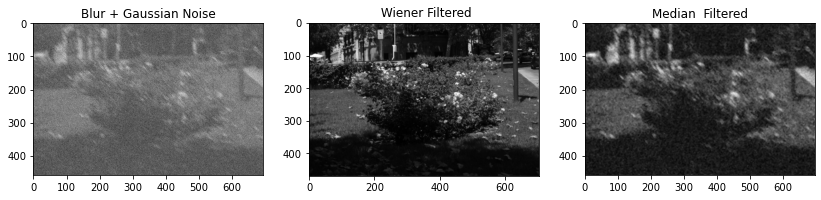

In [88]:
plot6('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/input4.png',40)

The median filter calculates the output pixel value by replacing the central pixel with the median value within a defined neighborhood.

In [89]:
# Gaussian Filter and Weiner  Filter Comparison of All images where dev is for the noise

def plot7(adress,dev):
    if __name__ == '__main__':
        path = adress
        # Original Image
        img = cv2.imread(path)
        # Grayscale Image
        grayscale_img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

        # Blur the image
        blurred_img = blur(grayscale_img, 10)

        # Add Gaussian noise
        noisy_img = addGaussNoise(blurred_img, dev)

        # Apply Wiener Filter
        kernel = gaussian_kernel(2)
        filtered_img = wiener_filter(grayscale_img, kernel, 50)
        
         #Apply Median  Filter 
        smoothed_image = cv2.GaussianBlur(noisy_img, (5, 5), 0)
        
        display = [ noisy_img, filtered_img, smoothed_image]
        label = ['Blur + Gaussian Noise', ' Wiener Filtered', ' Gauusian Filtered ']

        fig = plt.figure(figsize=(14, 10))
        for i in range(len(display)-1):
            fig.add_subplot(1, 3, i + 1)
            plt.imshow(display[i], cmap='gray')
            plt.title(label[i])
        plt.subplot(1,3,3)
        plt.imshow(display[2],cmap ='gray')
        plt.title(label[2])
        
        def calculate_psnr(image1, image2):
            if image1.shape[0] != image2.shape[0] or image1.shape[1] != image2.shape[1]:
                image1 = cv2.resize(image1, (image2.shape[1], image2.shape[0]))
                mse = np.mean((image1.astype(np.float32) - image2.astype(np.float32)) ** 2)
                max_pixel = 255.0
                psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
                return psnr
        
        psnrGauss = calculate_psnr(smoothed_image,grayscale_img)
        print("\n Gaussian  PSNR: ",psnrGauss)


 Gaussian  PSNR:  20.874064626277228


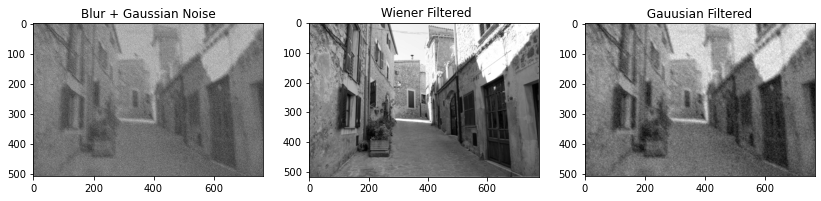

In [90]:
plot7('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image1.png',40)


 Gaussian  PSNR:  19.32652465389316


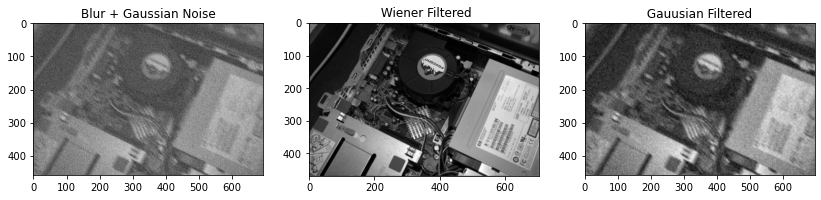

In [91]:
plot7('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image2.png',40)


 Gaussian  PSNR:  25.542918983092665


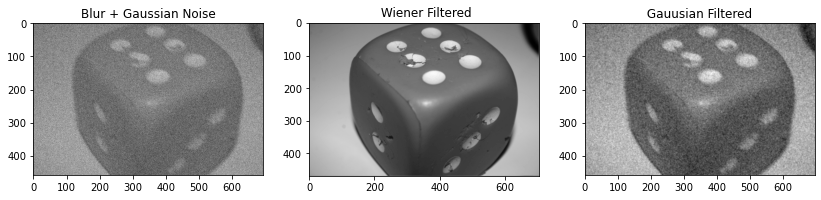

In [92]:
plot7('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/image3.png',40)


 Gaussian  PSNR:  20.271377428884406


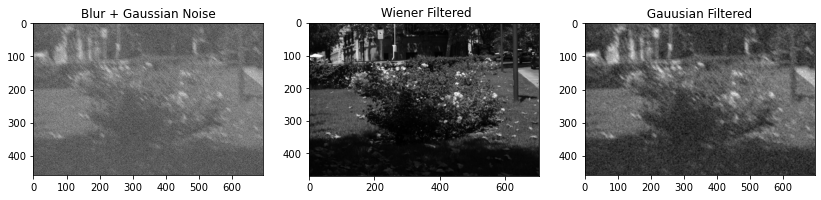

In [93]:
plot7('C:/Users/Shubham123/Desktop/DIP Assignments/Assignmnet3/Dataset/input4.png',40)

Gaussian filtering applies a weighted average to each pixel in an image using a Gaussian kernel, emphasizing nearby pixels more than distant ones